<a href="https://colab.research.google.com/github/guruprashanth2004/tomato-detection/blob/main/tomato_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Saving Tomatoes-Farm-scaled-1.jpg to Tomatoes-Farm-scaled-1 (1).jpg
Total Tomatoes Detected: 14
Original Image:


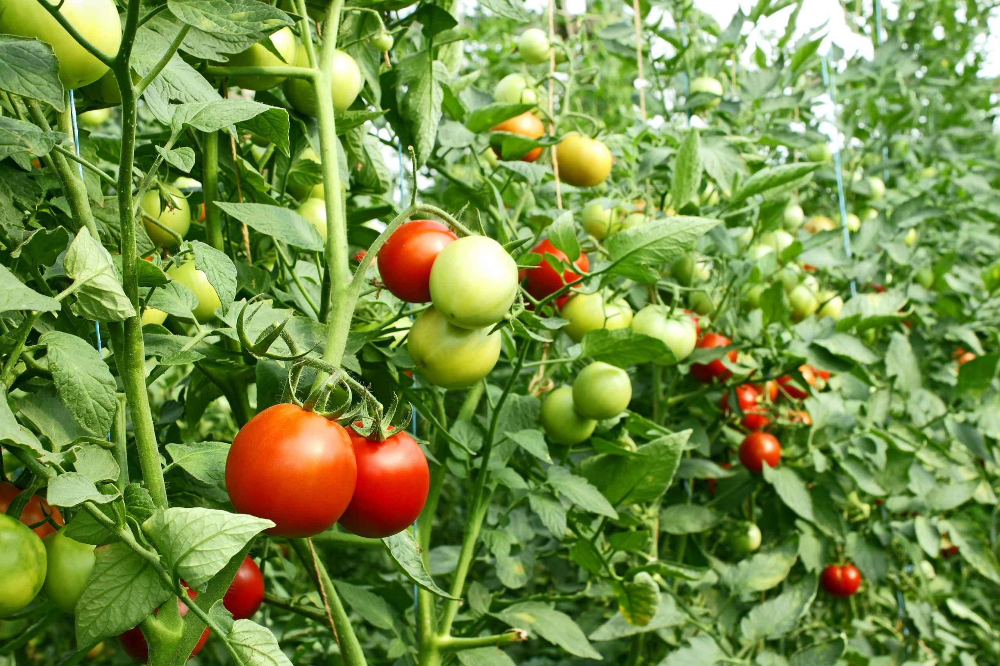

Detected Tomatoes:


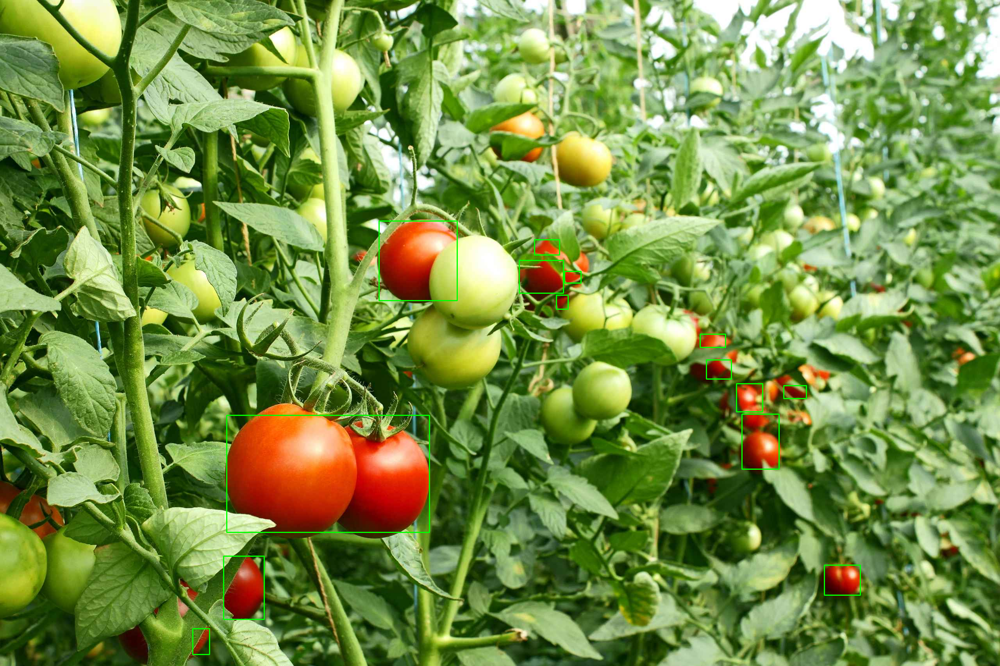

In [3]:
# Import required libraries
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from google.colab import files

# Upload an image of tomato crops
uploaded = files.upload()
image_path = list(uploaded.keys())[0]

# Read the image
image = cv2.imread(image_path)
image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)  # Convert to HSV color space

# Define HSV range for detecting red tomatoes
lower_red = np.array([0, 120, 70])    # Lower bound of red
upper_red = np.array([10, 255, 255])  # Upper bound of red

# Create a mask to detect red color
mask = cv2.inRange(image_hsv, lower_red, upper_red)

# Find contours of detected tomatoes
contours, _ = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Initialize count
tomato_count = 0

# Draw bounding boxes around detected tomatoes
for contour in contours:
    if cv2.contourArea(contour) > 500:  # Ignore small detections
        x, y, w, h = cv2.boundingRect(contour)
        cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)  # Draw green box
        tomato_count += 1  # Increase count

# Display the results
print(f"Total Tomatoes Detected: {tomato_count}")

print("Original Image:")
cv2_imshow(cv2.imread(image_path))

print("Detected Tomatoes:")
cv2_imshow(image)
